<a href="https://colab.research.google.com/github/salvatoredebenedictis/ProcessMining/blob/main/Salvatore_de_Benedictis_FormalMethods_Exam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Process Mining with PM4PY**

Process mining is a set of techniques used for obtaining knowledge of and extracting insights from processes by the means of analyzing the event data, generated during the execution of the process. The end goal of process mining is to discover, model, monitor, and eventually optimize the underlying processes.

Process mining is based on event logs. We can describe event logs as a sequence of sequences of events. In most cases, whenever the process is supported by any IT system, it produces some kind of a log of actions completed by the users. For example, the log can contain all the actions a user performed in the app.

In [ ]:
!pip install pm4py

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 16.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for stringdist: filename=StringDist-1.0.9-cp38-cp38-linux_x86_64.whl size=24942 sha256=f1af30413f4116da7614d2293db642800c2b2f5652b0e2aa96e0f9d2d19c44d3
  Stored in directory: /root/.cache/pip/wheels/7a/64/e2/16f6a25a62a78f951c1715adb24ba2271ae9d7872f42378c3a
Successfully built stringdist


In [ ]:
# Import libraries 
import pm4py
from pm4py.objects.petri_net.obj import PetriNet, Marking
from pm4py.objects.petri_net.utils import petri_utils
import pandas as pd

In [ ]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive/MyDrive/FormalMethods

Mounted at /gdrive
/gdrive/MyDrive/FormalMethods


## Dataset import


In [ ]:
dataframe = pd.read_csv('Purchasing.csv',sep=';')
print('The dataset has {} rows and {} columns.'.format(dataframe.shape[0], dataframe.shape[1]))
dataframe.head()

The dataset has 9119 rows and 6 columns.


,Case ID,Start Timestamp,Complete Timestamp,Activity,Resource,Role
0,339,2011/02/16 14:31:00.000,2011/02/16 15:23:00.000,Create Purchase Requisition,Nico Ojenbeer,Requester
1,339,2011/02/17 09:34:00.000,2011/02/17 09:40:00.000,Analyze Purchase Requisition,Maris Freeman,Requester Manager
2,339,2011/02/17 21:29:00.000,2011/02/17 21:52:00.000,Amend Purchase Requisition,Elvira Lores,Requester
3,339,2011/02/18 17:24:00.000,2011/02/18 17:30:00.000,Analyze Purchase Requisition,Heinz Gutschmidt,Requester Manager
4,339,2011/02/18 17:36:00.000,2011/02/18 17:38:00.000,Create Request for Quotation Requester Manager,Francis Odell,Requester Manager


## Data Processing

In order to carry out process discovery, the dataset must contain the following types of information:

1. **Case ID** : a unique identifier of an entity going through the process. A common example could be the user’s unique ID, although, many possibilities are valid (it depends on the use case).
2. **Event**:  a step of the process, any activity that is a part of the process we are analyzing.
3. **Timestamp** : used for performance evaluation and determining the order of events, can be the time when the user entered/exited the given event (or both actually).
4. **Resources**: we can include more detailed information such as resources, country, user segment, etc. By leveraging additional information we are able to carry out a much more detailed analysis.

In [ ]:
#drop useless columns
dataframe.drop(columns=["Complete Timestamp", 'Role'], inplace=True)

#rename the columns to work well with the algorithms in pm4py
dataframe = dataframe.rename(columns={'Case ID': 'case:concept:name'})
dataframe = dataframe.rename(columns={'Activity': 'concept:name'})
dataframe = dataframe.rename(columns={'Start Timestamp': 'time:timestamp'})
dataframe = dataframe.rename(columns={'Resource': 'org:resource'})
dataframe['time:timestamp'] = pd.to_datetime(dataframe['time:timestamp'])

#dataframe = dataframe[:-8000] #reduction of dataset if needed

#visualization
print('The dataset has {} rows and {} columns.'.format(dataframe.shape[0], dataframe.shape[1]))
dataframe.head()

The dataset has 9119 rows and 4 columns.


,case:concept:name,time:timestamp,concept:name,org:resource
0,339,2011-02-16 14:31:00,Create Purchase Requisition,Nico Ojenbeer
1,339,2011-02-17 09:34:00,Analyze Purchase Requisition,Maris Freeman
2,339,2011-02-17 21:29:00,Amend Purchase Requisition,Elvira Lores
3,339,2011-02-18 17:24:00,Analyze Purchase Requisition,Heinz Gutschmidt
4,339,2011-02-18 17:36:00,Create Request for Quotation Requester Manager,Francis Odell


In [ ]:
from pm4py.read import log_converter
log = log_converter.apply(dataframe)

# Process Discovery

Process Discovery algorithms want to find a suitable process model that describes the order of events/activities that are executed during a process execution.

## Directly-Follows Graph

Process models modeled using Petri nets have a well-defined semantic: a process execution starts from the places included in the initial marking and finishes at the places included in the final marking. In this section, another class of process models, Directly-Follows Graphs, are introduced. Directly-Follows graphs are graphs where the nodes represent the events/activities in the log and directed edges are present between nodes if there is at least a trace in the log where the source event/activity is followed by the target event/activity. On top of these directed edges, it is easy to represent metrics like frequency (counting the number of times the source event/activity is followed by the target event/activity) and performance (some aggregation, for example, the mean, of time inter-lapsed between the two events/activities).

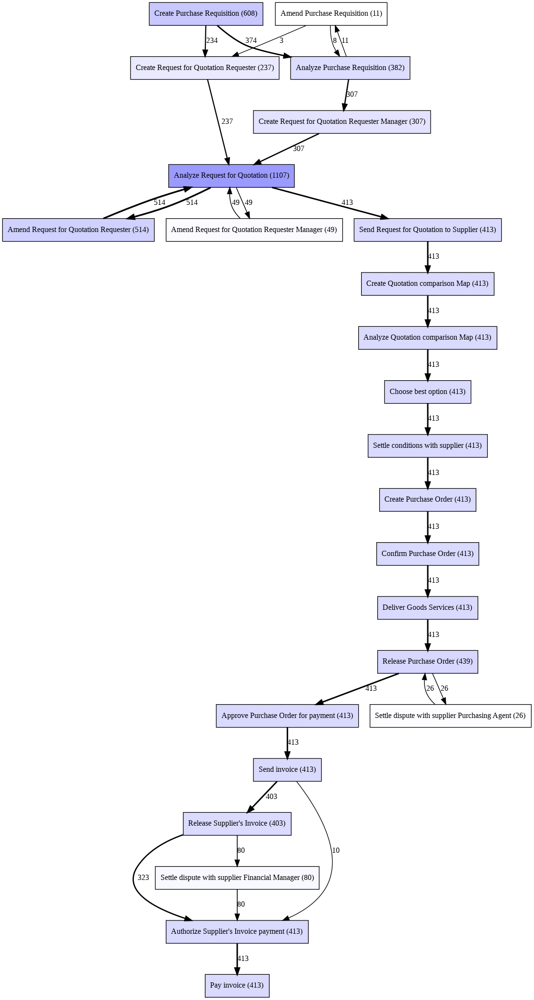

In [ ]:
from pm4py.algo.discovery.dfg import algorithm as dfg_discovery
from pm4py.visualization.dfg import visualizer as dfg_visualiser
dfg = dfg_discovery.apply(log)
graph_visualisation = dfg_visualiser.apply(dfg, log=log, variant=dfg_visualiser.Variants.FREQUENCY)
dfg_visualiser.view(graph_visualisation)
dfg_visualiser.save(graph_visualisation, 'DirectlyFollowsGraphPurchase.png')



---



## Alpha Miner

Alpha Miner is one of the best-known process discovery algorithms. In short, the algorithm scans the traces (sequences in the event log) for ordering relations and builds the footprint matrix. Then, it converts the matrix into a Petri net.

Process models expressed using Petri nets share a well-defined semantic: the execution of the process starts from the events included in the initial marking and finishes at the events included in the final marking.

Some of the characteristics of the algorithm:

*   it cannot handle loops of length one or two
*   invisible and duplicated tasks cannot be discovered
*   the discovered model might not be sound
*   it does not handle noise well




### Petri Net

A Petri net is a bipartite directed graph composed of places and transitions. A place is denoted by a circle and a transition is denoted by a
square. The connections, called arcs, are directed and are situated between
a place and a transition with the direction indicated by the arrowhead.

/usr/local/lib/python3.8/dist-packages/pm4py/utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


replaying log with TBR, completed variants ::   0%|          | 0/98 [00:00<?, ?it/s]

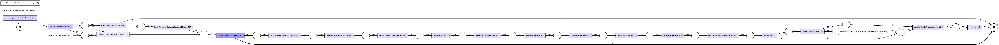

In [ ]:
from pm4py.objects.conversion.process_tree import converter as pt_converter
from pm4py.visualization.petri_net import visualizer as pt_visualiser
petri_net, initial_marking, final_marking = pm4py.discover_petri_net_alpha(log)
graph_visualisation = pt_visualiser.apply(petri_net, initial_marking, final_marking, variant=pt_visualiser.Variants.FREQUENCY, log=log)
pt_visualiser.view(graph_visualisation)
pt_visualiser.save(graph_visualisation, 'PetriNetPurchase_AlphaMiner.png')

### Petri Net Analysis

In order to analyze the net discovered, PM4PY uses Woflan which is a popular approach for soundness checking on workflow nets.

We need to check if the net is a WF-Net (workflow net). A WF-Net has the following conditions:
1. unique source place 
2. Unique sink place 
3. Every node is on a path from the source to the sink

To check the soundess of a Petri-Nets, Woflan's diagnosis goes through 13 steps and returns a Boolean value (True/False).   
During the 13 steps the diagnosis checks, step by step, the following criterias:

1. Checking if the PN and the markings are valid.
2. Checking if the PN is a workflow net.
3. Checking if all the places are covered by S-components.
4. Checking if there are not well-handled pairs.
5. Checking if there are places that are uncovered in uniform invariants.
6. Checking if there are places that are uncovered in weighted invariants.
7. Checking if the WPD (Workflow Process Definition) is proper.
8. Checking for substates in the MCG.
9. Checking if there are unbounded sequences.
10. Checking for dead tasks.
11. Checking for live tasks.
12. Checking for non-live tasks.
13. Checking for sequences leading to deadlocks.

In [ ]:
if(pm4py.analysis.check_is_workflow_net(petri_net) == True):
  print("The input Petri-net satisfies the WF-net conditions:  \n1. unique source place \n2. unique sink place \n3. every node is on a path from the source to the sink ")
else :
  print("The input Petri-net does not satisfy the WF-net conditions: \n1. unique source place \n2. unique sink place \n3. every node is on a path from the source to the sink")

The input Petri-net does not satisfy the WF-net conditions: 
1. unique source place 
2. unique sink place 
3. every node is on a path from the source to the sink


In [ ]:
pm4py.analysis.check_soundness(petri_net,initial_marking,final_marking)

Input is ok.
Petri Net is a not a worflow net.


False

### Performance

In pm4py, it is possible to compare the behavior contained in the log and the behavior contained in the model, in order to see if and how they match. Four different dimensions exist in process mining, including the measurement of replay fitness, the measurement of precision, the measurement of generalization, the measurement of simplicity.

The calculation of the replay fitness aim to calculate how much of the behavior in the log is admitted by the process model. For token-based replay, the percentage of traces that are completely fit is returned

Precision with approach token based replay: the different prefixes of the log are replayed (whether possible) on the model. At the reached marking, the set of transitions that are enabled in the process model is compared with the set of activities that follow the prefix. The more the sets are different, the more the precision value is low. The more the sets are similar, the more the precision value is high.

This works only if the replay of the prefix on the process model works: if the replay does not produce a result, the prefix is not considered for the computation of precision. Hence, the precision calculated on top of unfit processes is not really meaningful.

The main difference between the approaches is the replay method. Token-based replay is faster but based on heuristics (hence the result of the replay might not be exact). Alignments are exact, work on any kind of relaxed sound nets, but can be slow if the state-space is huge.

In [ ]:
fitness = pm4py.fitness_token_based_replay(log, petri_net, initial_marking, final_marking)
print("Fitness: ",fitness)

replaying log with TBR, completed variants ::   0%|          | 0/98 [00:00<?, ?it/s]

Fitness:  {'perc_fit_traces': 0.0, 'average_trace_fitness': 0.840391062891988, 'log_fitness': 0.8491462170504822, 'percentage_of_fitting_traces': 0.0}


In [ ]:
prec = pm4py.precision_token_based_replay(log, petri_net, initial_marking, final_marking)
print("Precision: ",prec)

replaying log with TBR, completed variants ::   0%|          | 0/840 [00:00<?, ?it/s]

Precision:  0.26187951147754096


## Heuristic Miner

Heuristics Miner is an improvement of the Alpha Miner algorithm and acts on the Directly-Follows Graph. It provides a way to handle noise and to find common constructs. The output of the algorithm is a Heuristics Net — an object that contains both the activities and the relationships between them. The Heuristics Net can be then converted into a Petri net. 

Some of the characteristics of the algorithm:


*   takes frequency into account
*   detects short loops and skipping events
*   does not guarantee that the discovered model will be sound


### Petri Net

A Petri net is a bipartite directed graph composed of places and transitions. A place is denoted by a circle and a transition is denoted by a
square. The connections, called arcs, are directed and are situated between
a place and a transition with the direction indicated by the arrowhead.

replaying log with TBR, completed variants ::   0%|          | 0/98 [00:00<?, ?it/s]

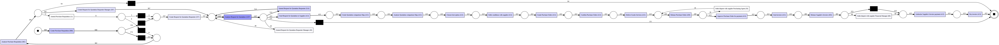

In [ ]:
petri_net, initial_marking, final_marking = pm4py.discover_petri_net_heuristics(log)
graph_visualisation = pt_visualiser.apply(petri_net, initial_marking, final_marking, variant=pt_visualiser.Variants.FREQUENCY,log=log)
pt_visualiser.view(graph_visualisation)
pt_visualiser.save(graph_visualisation, 'PetriNetPurchase_HeuristicMiner.png')

### Petri Net Analysis

In order to analyze the net discovered, PM4PY uses Woflan which is a popular approach for soundness checking on workflow nets.

We need to check if the net is a WF-Net (workflow net). A WF-Net has the following conditions:
1. unique source place 
2. Unique sink place 
3. Every node is on a path from the source to the sink

To check the soundess of a Petri-Nets, Woflan's diagnosis goes through 13 steps and returns a Boolean value (True/False).   
During the 13 steps the diagnosis checks, step by step, the following criterias:

1. Checking if the PN and the markings are valid.
2. Checking if the PN is a workflow net.
3. Checking if all the places are covered by S-components.
4. Checking if there are not well-handled pairs.
5. Checking if there are places that are uncovered in uniform invariants.
6. Checking if there are places that are uncovered in weighted invariants.
7. Checking if the WPD (Workflow Process Definition) is proper.
8. Checking for substates in the MCG.
9. Checking if there are unbounded sequences.
10. Checking for dead tasks.
11. Checking for live tasks.
12. Checking for non-live tasks.
13. Checking for sequences leading to deadlocks.

In [ ]:
if(pm4py.analysis.check_is_workflow_net(petri_net) == True):
  print("The input Petri-net satisfies the WF-net conditions:  \n1. unique source place \n2. unique sink place \n3. every node is on a path from the source to the sink ")
else :
  print("The input Petri-net does not satisfy the WF-net conditions")

The input Petri-net satisfies the WF-net conditions:  
1. unique source place 
2. unique sink place 
3. every node is on a path from the source to the sink 


In [ ]:
pm4py.analysis.check_soundness(petri_net,initial_marking,final_marking)

Input is ok.
Petri Net is a workflow net.
Every place is covered by s-components.
There are no dead tasks.
All tasks are live.


True

### Reachability Graph

A marking $M_n$ is said to be reachable from a marking $M_0$
if there exists a sequence of fi rings that transform $M_0–M_n$. 
A marking $M_j$ is said to be immediately reachable from $M_i$ if firing an enabled transition in Mi results in $M_j$. 

Given a Petri net and an initial marking, it is sometimes desirable to know all
of the states that can be reached by firing transitions. 
Merging the same nodes in a reachability tree produces the reachability graph.
One of the values of a reachability graph is that it can show cycles, which are
less easily identified from the reachability graph.


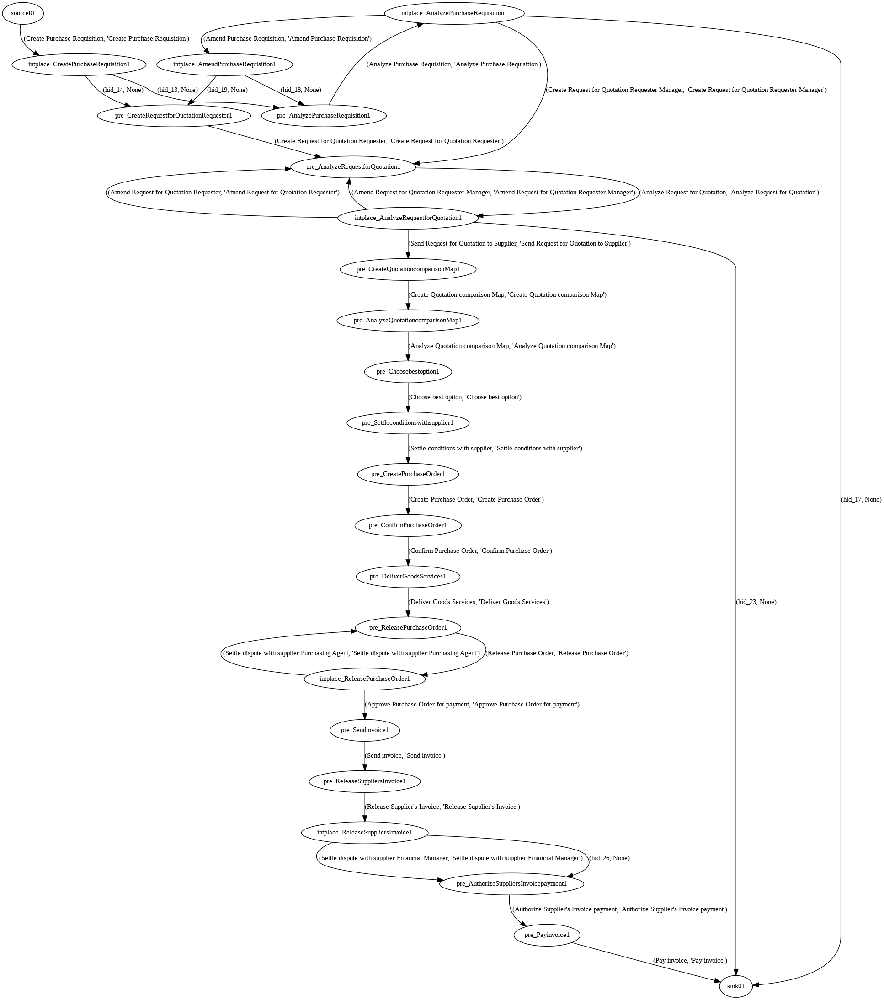

In [ ]:
from pm4py.objects.petri_net.utils import reachability_graph
from pm4py.visualization.transition_system import visualizer as ts_visualizer
ts = reachability_graph.construct_reachability_graph(petri_net, initial_marking)
gviz = ts_visualizer.apply(ts, parameters={ts_visualizer.Variants.VIEW_BASED.value.Parameters.FORMAT: "png"})
ts_visualizer.view(gviz)
ts_visualizer.save(gviz, 'ReachabilityGraph_HeuristicMiner.png')

### Performance

In pm4py, it is possible to compare the behavior contained in the log and the behavior contained in the model, in order to see if and how they match. Four different dimensions exist in process mining, including the measurement of replay fitness, the measurement of precision, the measurement of generalization, the measurement of simplicity.

The calculation of the replay fitness aim to calculate how much of the behavior in the log is admitted by the process model. For token-based replay, the percentage of traces that are completely fit is returned

Precision with approach token based replay: the different prefixes of the log are replayed (whether possible) on the model. At the reached marking, the set of transitions that are enabled in the process model is compared with the set of activities that follow the prefix. The more the sets are different, the more the precision value is low. The more the sets are similar, the more the precision value is high.

This works only if the replay of the prefix on the process model works: if the replay does not produce a result, the prefix is not considered for the computation of precision. Hence, the precision calculated on top of unfit processes is not really meaningful.

The main difference between the approaches is the replay method. Token-based replay is faster but based on heuristics (hence the result of the replay might not be exact). Alignments are exact, work on any kind of relaxed sound nets, but can be slow if the state-space is huge.

In [ ]:
fitness = pm4py.fitness_token_based_replay(log, petri_net, initial_marking, final_marking)
print("Fitness: ",fitness)

replaying log with TBR, completed variants ::   0%|          | 0/98 [00:00<?, ?it/s]

Fitness:  {'perc_fit_traces': 98.35526315789474, 'average_trace_fitness': 0.9991892308439226, 'log_fitness': 0.999079528718704, 'percentage_of_fitting_traces': 98.35526315789474}


In [ ]:
prec = pm4py.precision_token_based_replay(log, petri_net, initial_marking, final_marking)
print("Precision: ",prec)

replaying log with TBR, completed variants ::   0%|          | 0/840 [00:00<?, ?it/s]

Precision:  0.9760903426791278


## Inductive Miner

The Inductive Miner algorithm is an improvement of both the Alpha Miner and Heuristics Miner. The biggest difference is that it guarantees a sound process model with good values of fitness.

The underlying idea of the algorithm is to find a prominent split in the event log (there are different types of splits: sequential, parallel, concurrent, and loop). After finding the split, the algorithm recurs on the sub-logs (found by applying the split), until a base case is identified. The Inductive Miner does not work on Petri nets, but on process trees. 

Inductive miner models usually make extensive use of hidden transitions, especially for skipping/looping on a portion on the model. Furthermore, each visible transition has a unique label (there are no transitions in the model that share the same label).

Some of the characteristics of the algorithm:


*   Can handle invisible tasks
*   Model is sound



### Process Tree

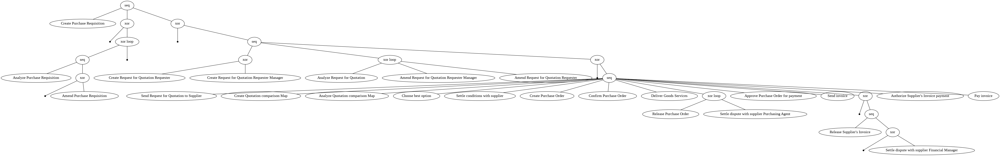

In [ ]:
from pm4py.algo.discovery.inductive import algorithm as inductive_miner
from pm4py.visualization.process_tree import visualizer as pt_visualiser
process_tree = inductive_miner.apply(log)
graph_visualisation = pt_visualiser.apply(process_tree)
pt_visualiser.view(graph_visualisation)
pt_visualiser.save(graph_visualisation, 'ProcessTreePurchase.png')

### Petri net

A Petri net is a bipartite directed graph composed of places and transitions. A place is denoted by a circle and a transition is denoted by a
square. The connections, called arcs, are directed and are situated between
a place and a transition with the direction indicated by the arrowhead.

replaying log with TBR, completed variants ::   0%|          | 0/98 [00:00<?, ?it/s]

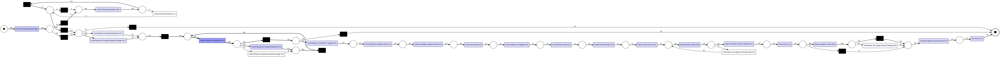

In [ ]:
from pm4py.objects.conversion.process_tree import converter as pt_converter
from pm4py.visualization.petri_net import visualizer as pt_visualiser
petri_net, initial_marking, final_marking = pt_converter.apply(process_tree)
graph_visualisation = pt_visualiser.apply(petri_net, initial_marking, final_marking, variant=pt_visualiser.Variants.FREQUENCY, log=log)
pt_visualiser.view(graph_visualisation)
pt_visualiser.save(graph_visualisation, 'PetriNetPurchase_Inductive Miner.png')

### Petri Net Analysis

In order to analyze the net discovered, PM4PY uses Woflan which is a popular approach for soundness checking on workflow nets.

We need to check if the net is a WF-Net (workflow net). A WF-Net has the following conditions:
1. unique source place 
2. Unique sink place 
3. Every node is on a path from the source to the sink

To check the soundess of a Petri-Nets, Woflan's diagnosis goes through 13 steps and returns a Boolean value (True/False).   
During the 13 steps the diagnosis checks, step by step, the following criterias:

1. Checking if the PN and the markings are valid.
2. Checking if the PN is a workflow net.
3. Checking if all the places are covered by S-components.
4. Checking if there are not well-handled pairs.
5. Checking if there are places that are uncovered in uniform invariants.
6. Checking if there are places that are uncovered in weighted invariants.
7. Checking if the WPD (Workflow Process Definition) is proper.
8. Checking for substates in the MCG.
9. Checking if there are unbounded sequences.
10. Checking for dead tasks.
11. Checking for live tasks.
12. Checking for non-live tasks.
13. Checking for sequences leading to deadlocks.

In [ ]:
if(pm4py.analysis.check_is_workflow_net(petri_net) == True):
  print("The input Petri-net satisfies the WF-net conditions:  \n1. unique source place \n2. unique sink place \n3. every node is on a path from the source to the sink ")
else :
  print("The input Petri-net does not satisfy the WF-net conditions")

The input Petri-net satisfies the WF-net conditions:  
1. unique source place 
2. unique sink place 
3. every node is on a path from the source to the sink 


In [ ]:
pm4py.analysis.check_soundness(petri_net,initial_marking,final_marking)

Input is ok.
Petri Net is a workflow net.
Every place is covered by s-components.
There are no dead tasks.
All tasks are live.


True

### Reachability Graph

A marking $M_n$ is said to be reachable from a marking $M_0$
if there exists a sequence of fi rings that transform $M_0–M_n$. 
A marking $M_j$ is said to be immediately reachable from $M_i$ if firing an enabled transition in Mi results in $M_j$. 

Given a Petri net and an initial marking, it is sometimes desirable to know all
of the states that can be reached by firing transitions. 
Merging the same nodes in a reachability tree produces the reachability graph.
One of the values of a reachability graph is that it can show cycles, which are
less easily identified from the reachability graph.


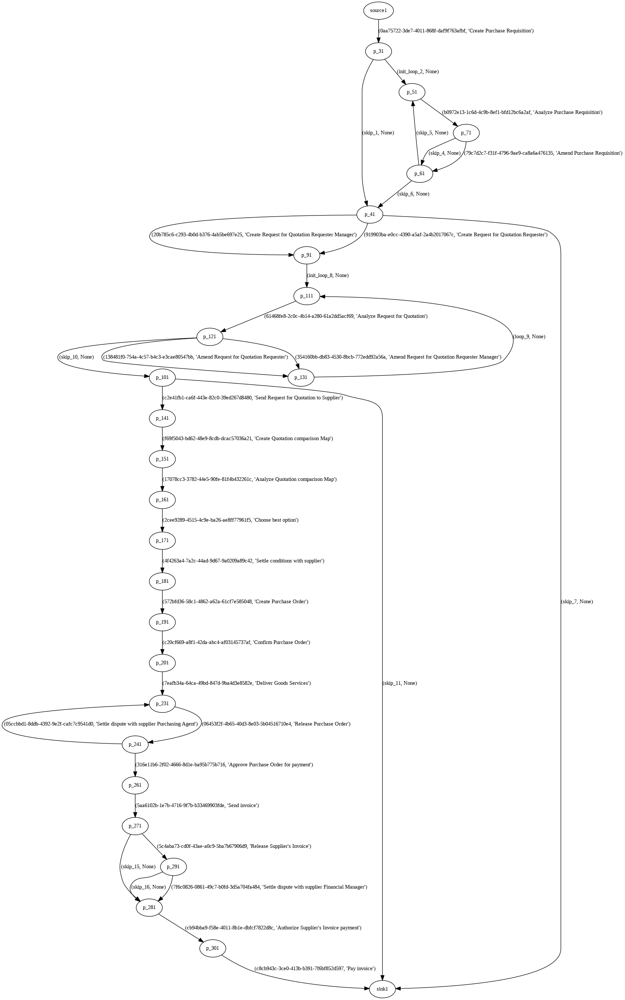

In [ ]:
from pm4py.objects.petri_net.utils import reachability_graph
from pm4py.visualization.transition_system import visualizer as ts_visualizer
ts = reachability_graph.construct_reachability_graph(petri_net, initial_marking)
gviz = ts_visualizer.apply(ts, parameters={ts_visualizer.Variants.VIEW_BASED.value.Parameters.FORMAT: "png"})
ts_visualizer.view(gviz)
ts_visualizer.save(gviz, 'ReachabilityGraph_Inductive Miner.png')

### Performance

In pm4py, it is possible to compare the behavior contained in the log and the behavior contained in the model, in order to see if and how they match. Four different dimensions exist in process mining, including the measurement of replay fitness, the measurement of precision, the measurement of generalization, the measurement of simplicity.

The calculation of the replay fitness aim to calculate how much of the behavior in the log is admitted by the process model. For token-based replay, the percentage of traces that are completely fit is returned

Precision with approach token based replay: the different prefixes of the log are replayed (whether possible) on the model. At the reached marking, the set of transitions that are enabled in the process model is compared with the set of activities that follow the prefix. The more the sets are different, the more the precision value is low. The more the sets are similar, the more the precision value is high.

This works only if the replay of the prefix on the process model works: if the replay does not produce a result, the prefix is not considered for the computation of precision. Hence, the precision calculated on top of unfit processes is not really meaningful.

The main difference between the approaches is the replay method. Token-based replay is faster but based on heuristics (hence the result of the replay might not be exact). Alignments are exact, work on any kind of relaxed sound nets, but can be slow if the state-space is huge.

In [ ]:
fitness = pm4py.fitness_token_based_replay(log, petri_net, initial_marking, final_marking)
print("Fitness: ",fitness)

replaying log with TBR, completed variants ::   0%|          | 0/98 [00:00<?, ?it/s]

Fitness:  {'perc_fit_traces': 100.0, 'average_trace_fitness': 1.0, 'log_fitness': 1.0, 'percentage_of_fitting_traces': 100.0}


In [ ]:
prec = pm4py.precision_token_based_replay(log, petri_net, initial_marking, final_marking)
print("Precision: ",prec)

replaying log with TBR, completed variants ::   0%|          | 0/840 [00:00<?, ?it/s]

Precision:  0.8831795013087202


## Considerazioni

As we can see all three algorithms discover a net for processes, the alpha miner is the fastest but it has bad performance caused by its characteristics.
The Heuristic Miner produces a net with the best precision and a good fitness while the Inductive Miner produces the perfect fitness and a good precision. So we can reject the alpha miner and we can consider both heuristc and inductive miner but since the heuristic miner does not guarantee that the discovered model will be sound (only in this case it is sound), usually the most used one is the Inductive Miner which provides a sound model.

# Process Discovery With OCEL

Traditional event logs, used by mainstream process mining techniques, require the events to be related to a case. A case is a set of events for a particular purpose. A case notion is a criteria to assign a case to the events.

However, in real processes this leads to two problems:


1.   If we consider the Order-to-Cash process, an order could be related to many different deliveries. If we consider the delivery as case notion, the same event of Create Order needs to be replicated in different cases (all the deliveries involving the order). This is called the **convergence problem**.
2.   If we consider the Order-to-Cash process, an order could contain different order items, each one with a different lifecycle. If we consider the order as case notion, several instances of the activities for the single items may be contained in the case, and this make the frequency/performance annotation of the process problematic. This is called the **divergence problem**.


Object-centric event logs relax the assumption that an event is related to exactly one case. Indeed, an event can be related to different objects of different object types.

Essentially, we can describe the different components of an object-centric event log as:



*   Events : having an identifier, an activity, a timestamp, a list of related objects and a dictionary of other attributes.
*   Objects : having an identifier, a type and a dictionary of other attributes.
*   Attribute names : the possible keys for the attributes of the event/object attribute map.
*   Object types : the possible types for the objects



In [ ]:
ocel = pm4py.read_ocel_csv("recruiting.csv")

/usr/local/lib/python3.8/dist-packages/pm4py/objects/ocel/util/extended_table.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[event_timestamp] = pd.to_datetime(df[event_timestamp])
/usr/local/lib/python3.8/dist-packages/pm4py/objects/ocel/util/extended_table.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[internal_index] = df.index


In [ ]:
ocel.get_extended_table

<bound method OCEL.get_extended_table of Object-Centric Event Log (number of events: 6980, number of objects: 1505, number of activities: 16, number of object types: 6, events-objects relationships: 21961)
Activities occurrences: {'submit application': 916, 'assign recruiter': 916, 'first screening': 916, 'send rejection': 781, 'check references': 729, 'consult manager': 729, 'assign vacancy': 458, 'invite for interview': 446, 'conduct interview': 446, 'open vacancy': 140, 'close vacancy for new applications': 140, 'make job offer': 135, 'offer accepted and hired': 89, 'close vacancy (no hire)': 51, 'job offer declined': 46, 'change manager': 42}
Object types occurrences (number of objects): {'applications': 916, 'applicants': 288, 'vacancies': 140, 'offers': 135, 'recruiters': 20, 'managers': 6}
Please use <THIS>.get_extended_table() to get a dataframe representation of the events related to the objects.>

## Data Processing

In [ ]:
ocel = pm4py.ocel_drop_duplicates(ocel)
ocel.get_extended_table

<bound method OCEL.get_extended_table of Object-Centric Event Log (number of events: 6980, number of objects: 1505, number of activities: 16, number of object types: 6, events-objects relationships: 21692)
Activities occurrences: {'submit application': 916, 'assign recruiter': 916, 'first screening': 916, 'send rejection': 781, 'check references': 729, 'consult manager': 729, 'assign vacancy': 458, 'invite for interview': 446, 'conduct interview': 446, 'open vacancy': 140, 'close vacancy for new applications': 140, 'make job offer': 135, 'offer accepted and hired': 89, 'close vacancy (no hire)': 51, 'job offer declined': 46, 'change manager': 42}
Object types occurrences (number of objects): {'applications': 916, 'applicants': 288, 'vacancies': 140, 'offers': 135, 'recruiters': 20, 'managers': 6}
Please use <THIS>.get_extended_table() to get a dataframe representation of the events related to the objects.>

## Object-centric Petri Net

Object-centric Petri Nets (OC-PN) are formal models, discovered on top of the object-centric event logs, using an underlying process discovery algorithm (such as the Inductive Miner). 

Techniques to discover Petri nets from event data assume precisely one case identifier per event. These case identifiers are used to correlate events, and the resulting discovered Petri net aims to describe the life-cycle of individual cases. In reality, there is not one possible case notion, but multiple intertwined case notions. For example, events may refer to mixtures of orders, items, packages, customers, and products. A package may refer to multiple items, multiple products, one order, and one customer. Therefore, we need to assume that each event refers to a collection of objects, each having a type (instead of a single case identifier). Such object-centric event logs are closer to data in real-life information systems. From an object-centric event log, we want to discover an object-centric Petri net with places that correspond to object types and transitions that may consume and produce collections of objects of different types. Object-centric Petri nets visualize the complex relationships among objects from different types.

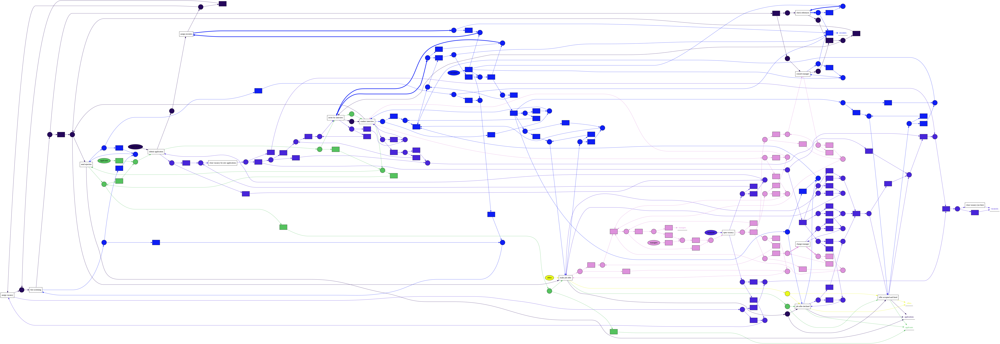

In [ ]:
ocpn = pm4py.discover_oc_petri_net(ocel)
pm4py.view_ocpn(ocpn, format='png')
pm4py.save_vis_ocpn(ocpn, 'ocpn.png')

## Directly-Follows Multigraphs

Object-centric directly-follows multigraphs are a composition of directly-follows graphs for the single object type, which can be annotated with different metrics considering the entities of an object-centric event log (i.e., events, unique objects, total objects).

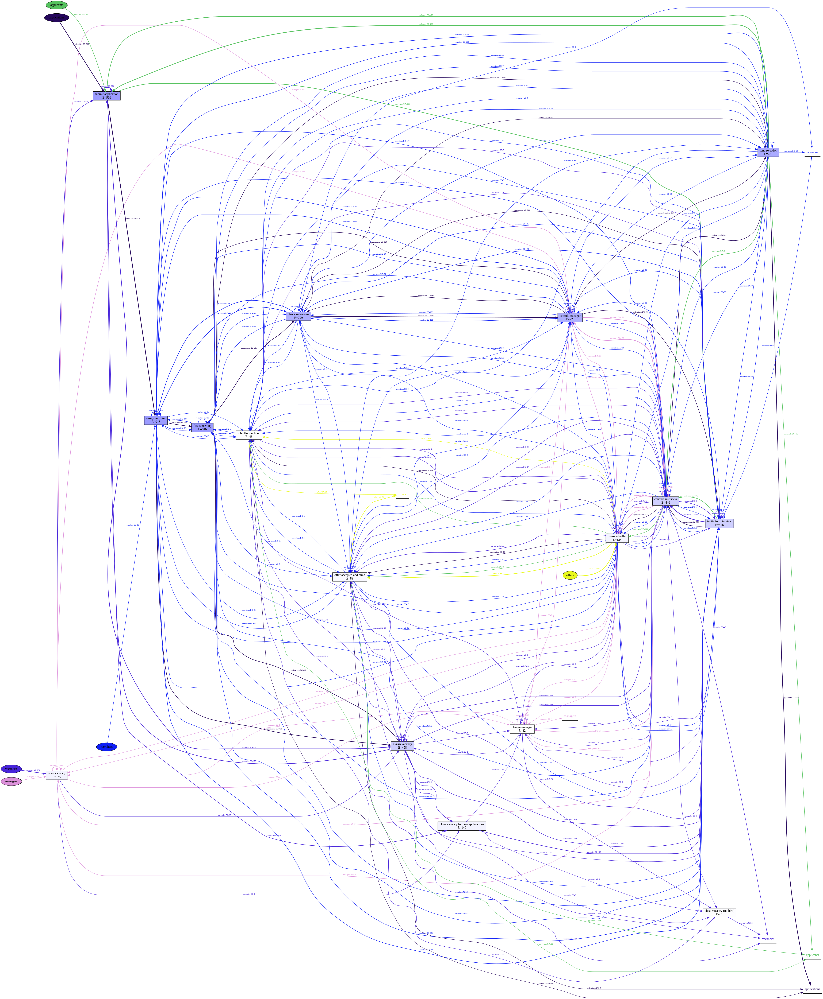

In [ ]:
ocdfg = pm4py.discover_ocdfg(ocel)
pm4py.view_ocdfg(ocdfg, annotation='frequency', format='png')
pm4py.save_vis_ocdfg(ocdfg, 'ocdfg.png', annotation='frequency')



---

